In [24]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import scipy

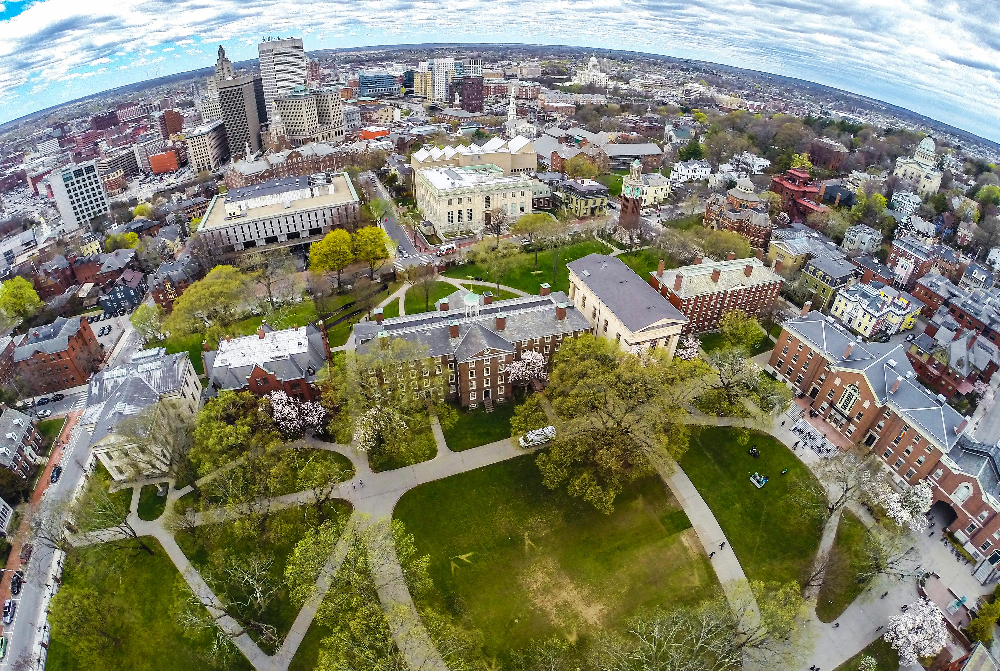

In [2]:
image_path = "brown_bird_view.jpeg"
image = Image.open(image_path)
image

In [6]:
image = np.array(image) / 255.

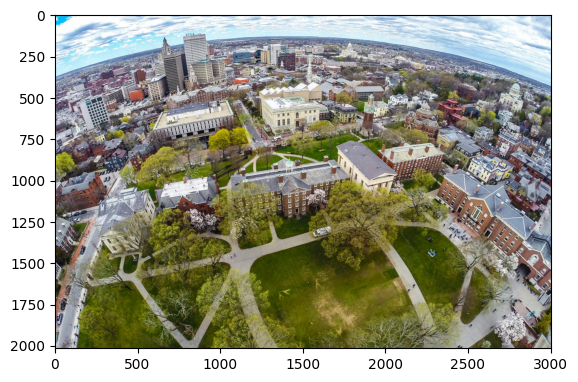

In [11]:
plt.imshow(image)

In [90]:
def make_kernel(kernel_size, sigma, channels):
    kernel_1d = scipy.signal.windows.gaussian(kernel_size, 1)
    kernel = kernel_1d.reshape(-1, 1) * kernel_1d
    kernel /= kernel.sum()
    return np.repeat(kernel[..., np.newaxis], channels, axis=-1)
    
def convert_to_toy_view(image, kernel_size=5):
    height, width, channels = image.shape
    focus_pos = height // 2
    new_image = np.empty([height-kernel_size+1, width-kernel_size+1, channels])
    kernel = np.ones([kernel_size, kernel_size, channels])/(kernel_size**2)
    for i in range(height-kernel_size+1):
        ratio = 10.0*np.abs(i - focus_pos) / focus_pos + 0.2
        kernel = make_kernel(kernel_size, ratio, channels)
        
        for j in range(width-kernel_size+1):
            patch = image[i:i+kernel_size, j:j+kernel_size]
            new_image[i, j] = np.sum(patch*kernel, axis=(0, 1))

    return new_image
            
            
            

In [88]:
new_image = convert_to_toy_view(image)

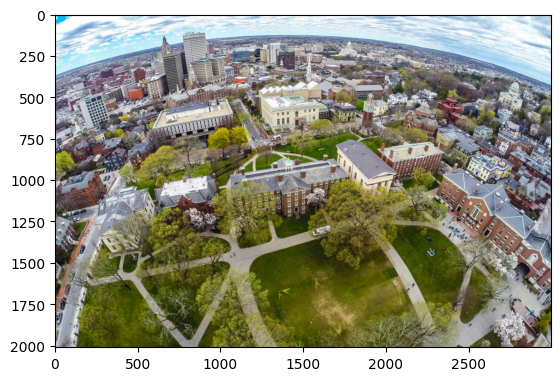

In [89]:
plt.imshow(new_image)
plt.savefig("tilted_result.pdf", format="pdf")

In [21]:
kernel_size = 10
channels = 3
kernel = np.random.normal(0, 1, (kernel_size, kernel_size, channels))
kernel /= kernel.sum(axis=(0, 1))

In [81]:
kernel_1d = scipy.signal.windows.gaussian(kernel_size, 5)
kernel = kernel_1d.reshape(-1, 1) * kernel_1d

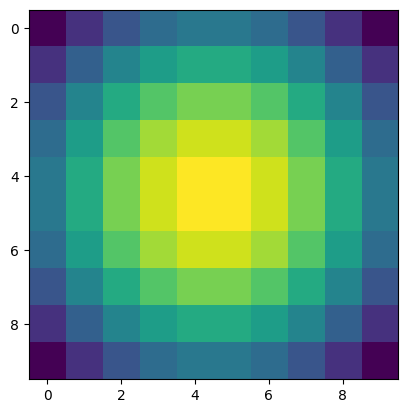

In [82]:
plt.imshow(kernel/kernel.sum())